In this notebook i'll be implementing a inversion process + uncertainty quantification using the emcee sampler.

In [21]:
from pathlib import Path
import os
from multiprocessing import Pool
import multiprocessing
import time

os.environ['JAX_PLATFORM_NAME'] = 'cpu'
os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=60"

import jax
import jax.numpy as jnp

import emcee
import jax

import numpy as np
import equinox as eqx
import h5py
import numdifftools as nd

import matplotlib.pyplot as plt

# Loading synthetic dataset

Let's start by recreating our synthetic data.

In [2]:
TESTING_DATA_FILE = Path("../../outputs/poisson_pressure_simulations_test.h5")

with h5py.File(TESTING_DATA_FILE, "r") as f:
    print(f.keys())
    X = jnp.array(f["positions"])
    T = jnp.array(f["kl_transform_matrice"])


P_ref_file = Path("../../raw_data/pressure_ref.dat")
Y_ref_file = Path("../../raw_data/YS_ref.dat")

P_ref = jnp.array(np.loadtxt(P_ref_file))
Y_ref = jnp.array(np.loadtxt(Y_ref_file))

pos  = [255, 755, 1255, 1755, 2255,  265,  765, 1265, 1765, 2265,  275, 775,
        1275, 1775, 2275,  285,  785, 1285, 1785, 2285,  295,  795, 1295, 1795, 2295]

X_ref = X[pos, :]

SIGMA = 0.5

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


Let's visualize it!

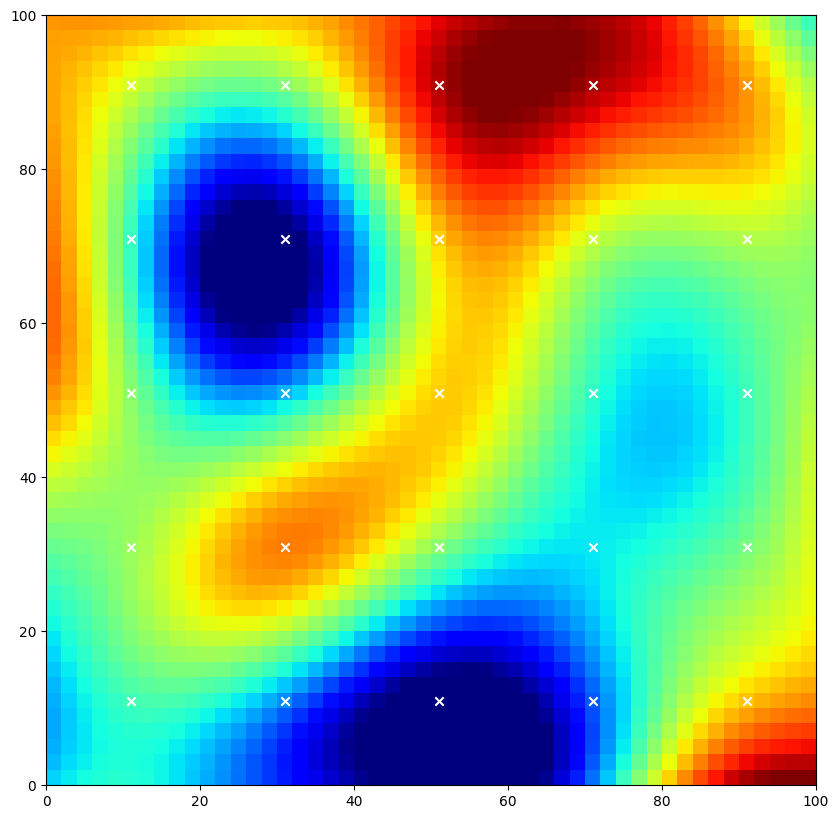

In [3]:
plt.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
plt.scatter(*X_ref.T, marker="x", c="w")
plt.gcf().set_size_inches(10, 10)

In [24]:
theta_ref = Y_ref@T

# Defining interval creation function

Lets define a function to detect the intervals of $\theta$ on which the network was trained on.

In [4]:
DATA_FILE = Path("../../outputs/poisson_pressure_simulations.h5")

with h5py.File(DATA_FILE, "r") as f:
    print(f.keys())
    theta = jnp.array(f["kl_coefficients"])

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


In [5]:
def generate_intervals():
    min_, max_ = theta.min(axis=0), theta.max(axis=0)
    intervals = [(float(mi), float(ma)) for mi, ma in zip(min_, max_)]

    return intervals, min_, max_

INTERVALS, MIN, MAX = generate_intervals()

MIN, MAX

(Array([-4.133799 , -4.4780173, -4.4256234, -4.344691 , -4.465861 ,
        -5.003207 , -4.6752343, -4.063142 , -3.9797022, -4.084783 ,
        -4.301813 , -3.9780731, -4.853323 , -4.5483127, -4.579231 ,
        -4.435594 , -4.527643 , -4.194682 , -4.4632397, -4.656494 ,
        -4.451278 , -4.431556 , -4.2111244, -4.596984 ], dtype=float32),
 Array([4.1295114, 4.6543264, 3.8184648, 4.4239864, 4.4186835, 4.7119555,
        4.346513 , 3.8344748, 4.9299054, 4.2323565, 4.3842645, 4.2754087,
        4.1166024, 4.200948 , 3.9405203, 4.1797338, 4.5421233, 4.5354877,
        4.1899757, 4.101758 , 4.0647583, 4.3309145, 4.366222 , 4.010905 ],      dtype=float32))

In [6]:
def generate_initial_guess_normal(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.normal(key_k)*(a-b)/6 + (a+b)/2
        guesses.append(guess)
    
    return jnp.array(guesses)


def generate_initial_guess_uniform(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.uniform(key_k, minval=a, maxval=b)
        guesses.append(guess)
    

    return jnp.array(guesses)

# Loading DeepONet

Now load our deeponet from its file.

In [8]:
# from typing import Callable

# class DeepOnet(eqx.Module):
#     branch_net: eqx.nn.MLP
#     trunk_net: eqx.nn.MLP
#     bias: jax.Array

#     def __init__(
#         self, 
#         in_branch: int,
#         in_trunk: int,
#         width: int,
#         depth: int,
#         interact: int,
#         activation: Callable,
#         *,
#         key
#     ):
#         """
#         Simplified deeponet using twin hidden architectures
#         """

#         b_key, t_key = jax.random.split(key)

#         self.branch_net = eqx.nn.MLP(
#             in_branch,
#             interact,
#             width,
#             depth,
#             activation,
#             key=b_key
#         )

#         self.trunk_net = eqx.nn.MLP(
#             in_trunk,
#             interact,
#             width,
#             depth,
#             activation,
#             final_activation=activation,
#             key=b_key
#         )

#         self.bias = jnp.zeros((1,))

    
#     def __call__(self, x_branch, x_trunk):
#         """
#         x_branch.shape = (in_size_branch,)
#         x_trunk.shape = (1,)

#         return shape: "scalar"
#         """

#         branch_out = self.branch_net(x_branch)
#         trunk_out = self.trunk_net(x_trunk)

#         inner_product = jnp.sum(branch_out*trunk_out, keepdims=True)

#         return (inner_product + self.bias)[0]


In [33]:
# key = jax.random.key(1325)
# # key = jax.random.key(6757)

# deeponet = DeepOnet(
#     24,
#     2,
#     256,
#     5,
#     128,
#     activation=jax.nn.relu,
#     key=key
# )

# deeponet = eqx.tree_deserialise_leaves("../../outputs/fivespot_deeponet_best.eqx", deeponet)

# Defining log posterior

Let's now define a log prior and log likelihood to then define the log posterior. Our parameters are $(k, \beta, x_0, v_0)$ we know that they can't live outside our parameter space we can model this as a uniform prior over the space the DeepONet is trained on to avoid it getting out of it and letting it free over the trained space.

In [7]:
import sys
sys.path.append("../../modules")

from emcee_logprob import log_probability, log_probability_numerical

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


In [8]:
theta = jnp.array(np.random.uniform(-4, 4, size=24))

(theta >= MIN)
(theta <= MAX)

Array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True], dtype=bool)

In [11]:
# @jax.jit
# def log_likelihood(theta):
#     out = jax.vmap(deeponet, in_axes=(None, 0))(theta, X_ref)
#     return -0.5 * jnp.sum((P_ref - out) ** 2 / SIGMA**2)     




# def log_prior(theta):
#     if  all( (MIN <= theta) & (theta <= MAX) ):
#         return 0.0
#     return -jnp.inf


# def log_probability(theta):
#     lp = log_prior(theta)
#     if not jnp.isfinite(lp):
#         return -jnp.inf
#     return lp + log_likelihood(theta)



Let's also define a numerical log posterior!

In [9]:
from simulators_tools_marcio import coordinates, simulationpar, five_spot_simulation
import simulators_tools_marcio as sim

In [13]:
# def log_likelihood_numerical(theta):
    
#     simul_setup ='fivespot2D'
#     beta = 9.8692e-14
#     rho  = 1.
#     mu   = 1.0e-03
#     Dom  = [100., 100., 1.]
#     mesh = [50, 50, 1]
#     BHP  = 101325.0
#     PL   = 0.
#     PR   = 0.
#     rw   = 0.125
#     q    = 100.
#     pos  = [255, 755, 1255, 1755, 2255,  265,  765, 1265, 1765, 2265,  275, 775,
#             1275, 1775, 2275,  285,  785, 1285, 1785, 2285,  295,  795, 1295, 1795, 2295]
#     inputpar = simulationpar(simul_setup,beta,rho,mu,Dom,mesh,BHP,PR,PL,rw,q,pos,0)
#     nx = mesh[0]
#     ny = mesh[1]
    
#     # Lets instead of loading if from a file, load it internally
#     # filen = 'YS_ref.dat'
#     # Y  = get_permeability_field(filen)
#     # #Y = np.log(np.arange(1,nx*ny+1,dtype='float'))
#     # #Y    = np.ones((mesh[0]*mesh[1],))
    
#     Y = T@theta
    
#     p = five_spot_simulation(inputpar, Y)

#     return -0.5 * jnp.sum((P_ref - p[pos]) ** 2 / SIGMA**2)    

# Checking computational cost

In [14]:
theta = jnp.array(np.random.normal(size=(24,)))

Let's start by checking the cost of the numerical likelihood

In [15]:
%%timeit

log_likelihood_numerical(theta)

33.9 ms ± 6.05 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [18]:
%%timeit
    
log_likelihood(theta)

49.8 μs ± 459 ns per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [19]:
%%timeit
nd.Gradient(log_likelihood_numerical)(theta)


KeyboardInterrupt



In [26]:
%%timeit
nd.Gradient(log_likelihood)(theta)

66.8 ms ± 237 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [27]:
grad_lik = jax.grad(log_likelihood)

In [28]:
%%timeit
grad_lik(theta)

1.8 ms ± 130 μs per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Running EMCEE

In [12]:
key = jax.random.key(42)
pos_0 = []

for _ in range(2*24):
    key, skey = jax.random.split(key)
    pos_0.append(
        generate_initial_guess_normal(skey)
    )

    
pos_0 = jnp.array(pos_0)

In [16]:
MULTI_PROCESSING = True

if MULTI_PROCESSING:

    with multiprocessing.get_context("spawn").Pool(processes=30) as pool:
    
        nwalkers, ndim = pos_0.shape
    
        sampler = emcee.EnsembleSampler(
            nwalkers, ndim, log_probability, pool=pool
        )
        start = time.perf_counter()
        sampler.run_mcmc(pos_0, 100_000, progress=True)
        end = time.perf_counter()
        multi_time = end - start
        print("Multiprocessing took {0:.1f} seconds".format(multi_time))


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [17:24<00:00, 95.70it/s]


Multiprocessing took 1057.5 seconds
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_tran

In [20]:
if MULTI_PROCESSING:

    with multiprocessing.get_context("spawn").Pool(processes=30) as pool:
    
        nwalkers, ndim = pos_0.shape
    
        sampler_num = emcee.EnsembleSampler(
            nwalkers, ndim, log_probability_numerical, pool=pool
        )
        start = time.perf_counter()
        sampler_num.run_mcmc(pos_0, 100_000, progress=True)
        end = time.perf_counter()
        multi_time = end - start
        print("Multiprocessing took {0:.1f} seconds".format(multi_time))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [4:22:31<00:00,  6.35it/s]


Multiprocessing took 15763.6 seconds
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>
<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_tra

In [22]:
flat_samples = sampler.get_chain(discard=5000, flat=True, thin=15)
print(flat_samples.shape)

(303984, 24)


In [27]:
fitted  = flat_samples.mean(axis=0).tolist()
labels = [f"theta_{i}" for i in range(1, len(theta_ref)+1)]

print("Reference Vals vs Fitted Values\n")

for fit, ref, par in zip(fitted, theta_ref, labels):
    print(f"{par} - ref: {ref:5.2f} - fit: {fit:5.2f}")

Reference Vals vs Fitted Values

theta_1 - ref: -50.75 - fit: -0.40
theta_2 - ref: -151.88 - fit: -0.20
theta_3 - ref: 334.27 - fit:  0.10
theta_4 - ref: 215.62 - fit:  0.43
theta_5 - ref: -22.45 - fit:  1.28
theta_6 - ref:  6.03 - fit:  0.31
theta_7 - ref: 160.26 - fit:  0.45
theta_8 - ref:  7.90 - fit:  0.69
theta_9 - ref: -184.41 - fit: -0.35
theta_10 - ref: -123.43 - fit: -1.47
theta_11 - ref: -92.56 - fit: -1.83
theta_12 - ref: -146.26 - fit: -2.91
theta_13 - ref: 40.29 - fit: -0.22
theta_14 - ref: -38.17 - fit: -1.23
theta_15 - ref: 17.92 - fit:  0.60
theta_16 - ref: -40.48 - fit: -1.07
theta_17 - ref: 47.50 - fit: -0.52
theta_18 - ref: -32.84 - fit: -0.79
theta_19 - ref: 27.13 - fit: -0.66
theta_20 - ref:  7.86 - fit: -2.23
theta_21 - ref: 17.89 - fit: -0.61
theta_22 - ref:  5.39 - fit:  0.55
theta_23 - ref:  0.11 - fit:  0.34
theta_24 - ref: -2.24 - fit: -1.21


In [28]:
fitted = jnp.array(fitted)

[Text(0.5, 1.0, 'Recovered'), Text(0.5, 0, 'X'), None]

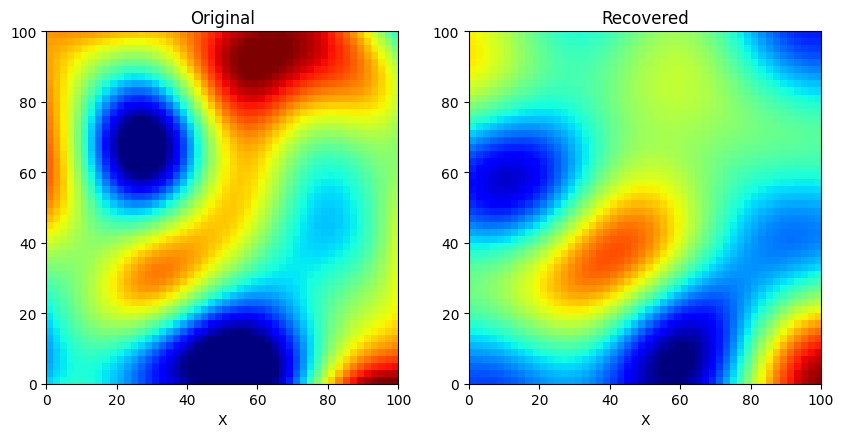

In [29]:
Y_recovered = (T@(fitted.reshape(-1, 1))).ravel().reshape(50, 50)

fig, [ax1, ax2] = plt.subplots(ncols=2, figsize=(10, 5))

ax1.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax1.set(title="Original", xlabel="X")
# ax1.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")

ax2.imshow(Y_recovered, origin="lower", cmap="jet", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax2.set(title="Recovered", xlabel="X", label="Y")
# ax2.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")

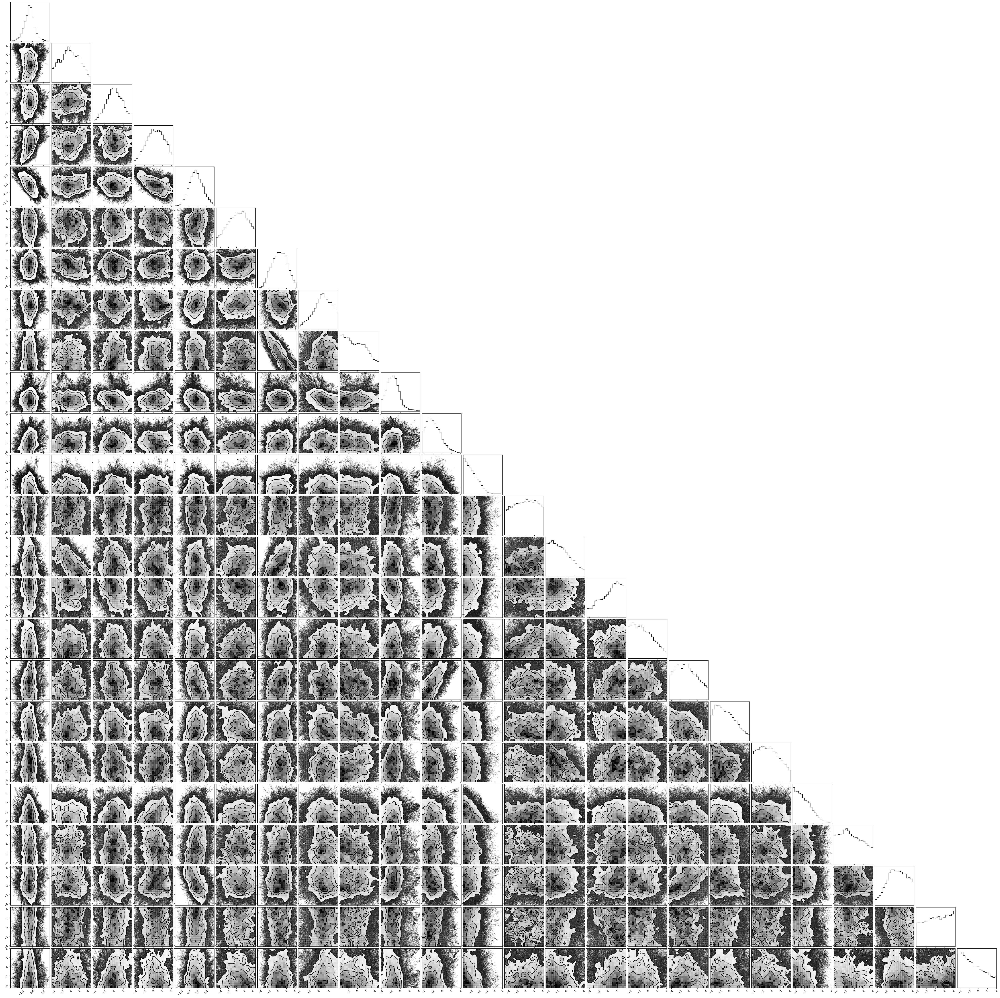

In [32]:
import corner
# labels = ["k", "b", "x0", "v0"]

fig = corner.corner(
    flat_samples,# labels=labels, truths=[k, beta, x0, v0]
);

fig.savefig("posteriors_emcee+sim_lowdpi.png", dpi=25)

# Saving inference data as Arviz inference data

In [33]:
import arviz

In [34]:
idata_numeric = arviz.from_emcee(sampler_num)
idata_net =  arviz.from_emcee(sampler)

In [35]:
idata_net.to_netcdf("../../outputs/inference_data_fivespot_emcee+deeponet.nc")
idata_numeric.to_netcdf("../../outputs/inference_data_fivespot_emcee+simulator.nc")

'../../outputs/inference_data_fivespot__emcee+simulator.nc'